Implementation of HE-net

Siyu He

2021-08-02


In [1]:
import os
import sys
import numpy as np
import scipy.stats as stats
import pandas as pd
import pickle
import anndata
import json
import scanpy as sc
import scipy
import PIL
import seaborn as sns
import torch
import matplotlib.pyplot as plt
from skimage import io
sys.path.append('HE-Net')
torch.manual_seed(0)  

### load data

In [3]:
from henet import  utils
dat_folder = 'data'
dat_name = 'CID44971'
#find_img = pd.DataFrame(os.listdir(os.path.join(dat_folder,dat_name,'spatial'))).loc[pd.DataFrame(os.listdir(os.path.join(dat_folder,dat_name,'spatial'))).loc[:,0].str.endswith('tif'),0].values[0]
#histo_img = io.imread(os.path.join(dat_folder,dat_name,'spatial',find_img))
cache = False
#if cache == False:
n_genes = 6000
adata1,variable_gene = utils.load_adata(dat_folder=dat_folder,
                                         dat_name=dat_name,
                                         use_other_gene=False,
                                         other_gene_list=None,
                                         n_genes=n_genes)


Trying to set attribute `.var` of view, copying.


The datasets have 1162 spots, and 19237 genes
removing mt/rp genes


In [6]:
dat_name = 'synthetic'
adata5 = sc.read_csv('data/simu_debug/counts.st_synth.csv')
adata5.obs_names = adata5.to_df().index
adata5.var_names = adata5.to_df().columns
adata5.var_names_make_unique()

In [7]:
adata5.var["mt"] = adata5.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata5, qc_vars=["mt"], inplace=True)
print('The datasets have',adata5.n_obs,'spots, and',adata5.n_vars,'genes')
adata5.var['rp'] = adata5.var_names.str.startswith('RPS') + adata5.var_names.str.startswith('RPL')
sc.pp.calculate_qc_metrics(adata5, qc_vars=['rp'], percent_top=None, log1p=False, inplace=True)

The datasets have 2500 spots, and 29733 genes


In [8]:
# Remove mitochondrial genes
print('removing mt/rp genes')
adata5 = adata5[:,-adata5.var['mt']]
adata5 = adata5[:,-adata5.var['rp']]

removing mt/rp genes


In [9]:
adata5_new = pd.DataFrame(np.zeros([adata5.to_df().shape[0],6000]),index =adata5.obs_names, columns=variable_gene )

In [11]:
inter_gene = np.intersect1d(variable_gene,adata5.var_names)

In [12]:
for i in inter_gene:
    adata5_new.loc[:,i] = np.array(adata5[:,i].X)

In [13]:
adata5_new_anndata = anndata.AnnData(np.log(
                                    #np.clip(adata5_new,0,2000)
                                        adata5_new
                                        +1))

/usr/local/lib/python3.9/site-packages/anndata/utils.py:141: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")


In [14]:
other_list_temp = variable_gene.intersection(adata5.var.index)
adata5 = adata5[:,other_list_temp]
sc.pp.normalize_total(adata5,inplace=True)
sc.pp.log1p(adata5)

/usr/local/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [53]:
map_info_list = []
for i in range(2500):
    x,y = np.where(np.arange(2500).reshape(50, 50)==i)
    map_info_list.append([x[0]+5,y[0]+5])   
map_info = pd.DataFrame(map_info_list,columns=['array_row','array_col'],index = adata5.obs_names)

In [14]:
map_info = pd.read_csv('simu_data/simu_10/spot_list.csv',index_col=0)

In [55]:
map_info.iloc[0,1]

5

In [17]:
tissue_hires_scalef = 0.20729685 #adata1.uns['spatial'][str('MBC_1B')]['scalefactors']['tissue_hires_scalef']
adata5_new_anndata.obsm['spatial']=np.array(map_info)*32

In [18]:
adata5.obsm['spatial']=np.array(map_info)*32

In [19]:
map_info * (1/tissue_hires_scalef)

,array_row,array_col
exper0_location_0,24.120000,24.120000
exper0_location_1,24.120000,28.944000
exper0_location_2,24.120000,33.768000
exper0_location_3,24.120000,38.592000
exper0_location_4,24.120000,43.416000
...,...,...
exper0_location_2495,260.495999,241.199999
exper0_location_2496,260.495999,246.023999
exper0_location_2497,260.495999,250.847999
exper0_location_2498,260.495999,255.671999


In [20]:
#adata5_new_anndata.X = adata5_new_anndata.X * 0.8

In [21]:
#adata5_new_anndata.obsm['spatial']

In [22]:
#adata6 = adata1.concatenate(adata5,join='outer',fill_value=0)[-3798:,:]
#adata6.uns = adata5.uns

### set dataloader

In [23]:
class dataset(torch.utils.data.Dataset):

    def __init__(self, 
                 spot, 
                 exp_spot, 
                 barcode_spot, 
                 #img_size,
                 #histo_img,
                 transform=None
                ):

        super(dataset, self).__init__()
        self.spot = spot
        self.exp_spot = exp_spot
        self.barcode_spot = barcode_spot
        self.transform = transform
        #self.img_size = img_size
        #self.histo_img = histo_img
    
    def __getitem__(self, idx):
        #print(idx)
        spot_x = self.spot[idx,0]
        spot_y = self.spot[idx,1]
        exp_spot = self.exp_spot[idx,:]
        barcode_spot = self.barcode_spot[idx]

        #x_l = int(spot_x-self.img_size/2)
        #x_r = int(spot_x+self.img_size/2)
        #y_l = int(spot_y-self.img_size/2)
        #y_r = int(spot_y+self.img_size/2)

        #img_spot = img[y_l:y_r,x_l:x_r,:]
        #img_spot = self.histo_img[y_l:y_r,x_l:x_r]
        #img_spot = img_spot-img_spot.min()
        #img_spot = img_spot/img_spot.max()
        
        #if self.transform is not None:
        #    img_spot = self.transform(img_spot)
        return exp_spot, barcode_spot#, img_spot
        #return exp_spot
        
    def __len__(self):

        return len(self.spot)

def prep_dataset(adata):

    #library_id = list(adata.uns.get("spatial",{}).keys())[0]
    #histo_img = adata.uns['spatial'][str(library_id)]['images']['hires']
    #spot_diameter_fullres = adata.uns['spatial'][str(library_id)]['scalefactors']['spot_diameter_fullres']
    #tissue_hires_scalef = adata.uns['spatial'][str(library_id)]['scalefactors']['tissue_hires_scalef']
    #circle_radius = spot_diameter_fullres *tissue_hires_scalef * 0.5 
    image_spot = adata.obsm['spatial'] #*tissue_hires_scalef

    #img_size=32
    N_spot = image_spot.shape[0]
    train_index = np.random.choice(image_spot.shape[0], size=int(N_spot*0.6), replace=False)
    #val_index=np.random.choice(image_spot.shape[0], size=int(N_spot*0.1), replace=False)
    test_index=np.random.choice(image_spot.shape[0], size=int(N_spot*0.4), replace=True)

    #train_transforms = transforms.Compose([transforms.ToTensor()])
    #val_transforms = transforms.Compose([transforms.ToTensor()])
    #test_transforms = transforms.Compose([transforms.ToTensor()])

    train_spot = image_spot[train_index]
    test_spot = image_spot[test_index]
    #val_spot = image_spot[val_index]

    adata_df = adata.to_df()

    train_exp_spot = np.array(adata_df.iloc[train_index])
    test_exp_spot = np.array(adata_df.iloc[test_index])
    #val_exp_spot = np.array(adata_df.iloc[val_index])


    train_barcode_spot = adata_df.index[train_index]
    test_barcode_spot = adata_df.index[test_index]
    #val_barcode_spot = adata_df.index[val_index]

    train_set = dataset(train_spot, train_exp_spot, train_barcode_spot, None)
    test_set = dataset(test_spot, test_exp_spot, test_barcode_spot,None)

    all_set = dataset( image_spot,np.array(adata_df), adata_df.index, None)

    return train_set,test_set,all_set

In [24]:
from henet import datasets
from torch.utils.data import DataLoader,ConcatDataset

train_set1,test_set1,all_set1 = datasets.prep_dataset(adata1, 'CID44971')
#train_set2,test_set2,all_set2 = datasets.prep_dataset(adata2)
#train_set3,test_set3,all_set3 = datasets.prep_dataset(adata3)
#train_set4,test_set4,all_set4 = datasets.prep_dataset(adata4)

train_set = ConcatDataset([train_set1,
                           #train_set1
                           #train_set2,
                           #train_set3
                          ])
test_set = ConcatDataset([test_set1,
                          #test_set1
                          #test_set2, 
                          #test_set2
                         ])


train_dataloader = DataLoader(train_set, shuffle=True, num_workers=1, batch_size=8)
test_dataloader= DataLoader(test_set, shuffle=True, num_workers=1, batch_size=8)
all_dataloader1 = DataLoader(all_set1, shuffle=True, num_workers=1, batch_size=8)
#all_dataloader2 = DataLoader(all_set2, shuffle=True, num_workers=1, batch_size=8)
#all_dataloader3 = DataLoader(all_set3, shuffle=True, num_workers=1, batch_size=8)
#all_dataloader4 = DataLoader(all_set4, shuffle=True, num_workers=1, batch_size=8)

/Users/siyuhe/Downloads/starfysh-poe_debug_3/HE-Net/henet/datasets/datasets.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_info.loc[:, 'imagerow'] = tissue_position_list.iloc[:, 3] * tissue_hires_scalef
/Users/siyuhe/Downloads/starfysh-poe_debug_3/HE-Net/henet/datasets/datasets.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_info.loc[:, 'imagecol'] = tissue_position_list.iloc[:, 4] * tissue_hires_scalef


In [25]:
train_set5,test_set5,all_set5 = prep_dataset(adata5_new_anndata)
all_dataloader5 = DataLoader(all_set5, batch_size=8)

In [26]:
#train_set6,test_set6,all_set6 = datasets.prep_dataset(adata6)
#all_dataloader6 = DataLoader(all_set6, shuffle=True, num_workers=1, batch_size=8)

DEVICE### load VAE model

In [27]:
from henet import model

# Model Hyperparameters
cuda = False
DEVICE = torch.device("cuda" if cuda else "cpu")
batch_size = 20
x_dim  =1024
hidden_dim = 400
latent_dim = 20
lr = 1e-3
epochs = 1000

encoder = model.Encoder(input_dim=x_dim, hidden_dim=hidden_dim, latent_dim=latent_dim,DEVICE=DEVICE)
decoder = model.Decoder(latent_dim=latent_dim, hidden_dim = hidden_dim, output_dim = x_dim)

vae = model.Model(Encoder=encoder, Decoder=decoder).to(DEVICE)
check_point_filename = 'HE-Net/trained_model_on_lab1A.pt'
vae.load_state_dict(torch.load(check_point_filename,map_location=torch.device('cpu') ))

<All keys matched successfully>

### ResNet

In [28]:
from henet import model
train_net = model.ResNet.resnet18()

In [29]:
import torch
import torch.nn as nn

import numpy as np

from tqdm import tqdm
from torchvision.utils import save_image

In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")
train_net.to(device)
lr = 0.001
#optimizer = torch.optim.SGD(oct_net.parameters(), lr=lr, momentum=0.9, weight_decay=5e-4)
optimizer = torch.optim.Adam(train_net.parameters(), lr=lr, amsgrad=True)

#### train the resnet

In [31]:
import matplotlib.pyplot as plt
import torch
#from models import BaseVAE
from torch import nn
from torch.nn import functional as F
from typing import List, Callable, Union, Any, TypeVar, Tuple

vae.eval()
train_flag = True
for epoch in range(200):
    losses = []
    for batch_idx, (exp_spot, barcode_spot, img_spot_i) in enumerate(train_dataloader):
        #print(batch_idx)
        img_spot_i = img_spot_i.transpose(3,2).transpose(2,1)
        img_spot_i = img_spot_i.reshape(-1, 1024)

        img_spot_i = img_spot_i.to(DEVICE)

        x_hat, mean, log_var = vae(img_spot_i) 

        mean = mean.view(exp_spot.shape[0], 3, 20)
        mean = mean.view(exp_spot.shape[0], 60)
        #mean = mean.cpu().detach().numpy()
        x_hat= x_hat.view(exp_spot.shape[0], 3, 32, 32)
        img_spot_i= img_spot_i.view(exp_spot.shape[0], 3, 32, 32)

        #print(exp_spot.shape)
        output1 = train_net(exp_spot[:,None,:].to(DEVICE))
        loss_model = nn.L1Loss()
        #print(output1.flatten())  
        loss = F.mse_loss(output1.reshape(-1), mean.reshape(-1))#+0.3*loss_model(output1, y1)
        if train_flag: 
            loss.backward() 
            optimizer.step()
            optimizer.zero_grad()
        losses.append(loss.cpu().detach().numpy())
    #print(np.mean(losses))
    print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", np.mean(losses))
  

	Epoch 1 complete! 	Average Loss:  1.290545
	Epoch 2 complete! 	Average Loss:  0.25440118
	Epoch 3 complete! 	Average Loss:  0.21329871
	Epoch 4 complete! 	Average Loss:  0.19138636
	Epoch 5 complete! 	Average Loss:  0.18274803
	Epoch 6 complete! 	Average Loss:  0.17790145
	Epoch 7 complete! 	Average Loss:  0.16827033
	Epoch 8 complete! 	Average Loss:  0.16921228
	Epoch 9 complete! 	Average Loss:  0.1665778
	Epoch 10 complete! 	Average Loss:  0.16396691
	Epoch 11 complete! 	Average Loss:  0.15966426
	Epoch 12 complete! 	Average Loss:  0.16069645
	Epoch 13 complete! 	Average Loss:  0.16110012
	Epoch 14 complete! 	Average Loss:  0.16357635
	Epoch 15 complete! 	Average Loss:  0.1609561
	Epoch 16 complete! 	Average Loss:  0.16246915
	Epoch 17 complete! 	Average Loss:  0.1906971
	Epoch 18 complete! 	Average Loss:  0.15908991
	Epoch 19 complete! 	Average Loss:  0.15725738
	Epoch 20 complete! 	Average Loss:  0.15942469
	Epoch 21 complete! 	Average Loss:  0.1584623
	Epoch 22 complete! 	Average

KeyboardInterrupt: 

In [38]:
#check_point_filename = 'HE-Net/trained_resnet_on_CID44791_3.pt'
#torch.save(train_net.state_dict(), check_point_filename)

### LOAD trained model

In [49]:
check_point_filename = 'HE-Net/trained_resnet_on_CID44791.pt'
train_net.load_state_dict(torch.load(check_point_filename,map_location=torch.device('cpu')))

<All keys matched successfully>

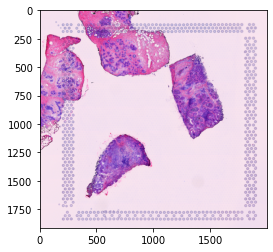

In [50]:
plt.imshow((all_set1.histo_img).astype(np.uint8))

(32, 32, 3)


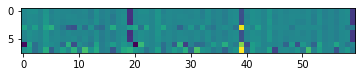

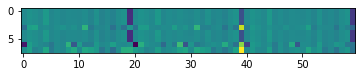

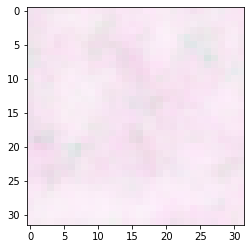

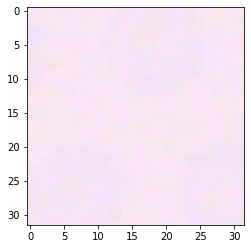

In [32]:
train_net.eval()
for batch_idx, (exp_spot, barcode_spot, img_spot_i) in enumerate(test_dataloader):
        img_spot_i = img_spot_i.transpose(3,2).transpose(2,1)
        img_spot_i = img_spot_i.reshape(-1, 1024)

        img_spot_i = img_spot_i.to(DEVICE)

        x_hat, mean, log_var = vae(img_spot_i) 

        mean = mean.view(exp_spot.shape[0], 3, 20)
        mean = mean.view(exp_spot.shape[0], 60)


        x_hat= x_hat.view(exp_spot.shape[0], 3, 32, 32)
        img_spot_i= img_spot_i.view(exp_spot.shape[0], 3, 32, 32)

        output1 = train_net(exp_spot[:,None,:].to(DEVICE))
        plt.figure()
        plt.imshow(mean.cpu().detach())
        plt.figure()
        plt.imshow(output1.cpu().detach())


        output1 = output1.view(exp_spot.shape[0],3,20)

        output1_1 = output1[:,0,:]
        output1_2 = output1[:,1,:]
        output1_3 = output1[:,2,:]

        mean = output1.view(mean.shape[0],3,20)


        x_predicted_1 = vae.Decoder(output1_1)
        x_predicted_1 = x_predicted_1.view(exp_spot.shape[0],32,32).cpu().detach().numpy()
        x_predicted_2 = vae.Decoder(output1_2)
        x_predicted_2 = x_predicted_2.view(exp_spot.shape[0],32,32).cpu().detach().numpy()
        x_predicted_3 = vae.Decoder(output1_3)
        x_predicted_3 = x_predicted_3.view(exp_spot.shape[0],32,32).cpu().detach().numpy()

        idx=1
        stacked_x = np.stack([x_predicted_1[idx],x_predicted_2[idx],x_predicted_3[idx]],axis=2)
        print(stacked_x.shape)
        plt.figure()
        plt.imshow(stacked_x)
        plt.figure()
        img_spot_iii =  img_spot_i[idx].cpu().detach().transpose(0,1).transpose(1,2)
        plt.imshow(img_spot_iii)
        break

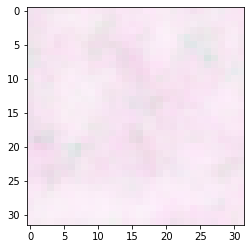

In [33]:
plt.imshow(stacked_x)

### predict on all

In [53]:
adata_test = adata1
all_dataloader_test = all_dataloader1


train_net.eval()
library_id = 'CID44971'#list(adata_test.uns.get("spatial",{}).keys())[0]
img_size=32
tissue_hires_scalef = adata_test.uns['spatial'][str(library_id)]['scalefactors']['tissue_hires_scalef']
#recon = np.ones(histo_img.shape)
recon = np.ones( adata_test.uns['spatial'][str(library_id)]['images']['hires'].shape)

KeyError: 'spatial'

In [ ]:
for batch_idx, (exp_spot, barcode_spot) in enumerate(all_dataloader_test):
    print(batch_idx, (exp_spot, barcode_spot))

In [148]:
adata_test = adata1#adata5_new_anndata#adata5_new_anndata
all_dataloader_test = all_dataloader1#all_dataloader5


train_net.eval()
#library_id = list(adata_test.uns.get("spatial",{}).keys())[0]
img_size=32
#tissue_hires_scalef = adata_test.uns['spatial'][str(library_id)]['scalefactors']['tissue_hires_scalef']
#recon = np.ones(histo_img.shape)
recon = np.ones([2000,2000,3])
for batch_idx, (exp_spot, barcode_spot, _) in enumerate(all_dataloader_test):
        
        #img_spot_i = img_spot_i.transpose(3,2).transpose(2,1)
        #img_spot_i = img_spot_i.reshape(-1, 1024)

        #img_spot_i = img_spot_i.to(DEVICE)

        #x_hat, mean, log_var = vae(img_spot_i) 

        #mean = mean.view(exp_spot.shape[0], 3, 20)
        #mean = mean.view(exp_spot.shape[0], 60)
        #mean = mean.cpu().detach().numpy()
        #x_hat= x_hat.view(exp_spot.shape[0], 3, 32, 32)
        #img_spot_i= img_spot_i.view(exp_spot.shape[0], 3, 32, 32)

        #print(exp_spot.shape)
        output1 = train_net(exp_spot[:,None,:].to(DEVICE))
        #plt.figure()
        #plt.imshow(mean.cpu().detach())
        #plt.figure()
        #plt.imshow(output1.cpu().detach())


        output1 = output1.view(exp_spot.shape[0],3,20)
        #print(mean.shape)
        #print(output1.shape)


        output1_1 = output1[:,0,:]
        output1_2 = output1[:,1,:]
        output1_3 = output1[:,2,:]

        x_predicted_1 = vae.Decoder(output1_1)
        x_predicted_1 = x_predicted_1.view(exp_spot.shape[0],32,32).cpu().detach().numpy()
        x_predicted_2 = vae.Decoder(output1_2)
        x_predicted_2 = x_predicted_2.view(exp_spot.shape[0],32,32).cpu().detach().numpy()
        x_predicted_3 = vae.Decoder(output1_3)
        x_predicted_3 = x_predicted_3.view(exp_spot.shape[0],32,32).cpu().detach().numpy()

        for j,i in zip(range(len(barcode_spot)),barcode_spot):
            spot_x = ((adata_test[i].obsm['spatial'] )[0])[0]
            spot_y = ((adata_test[i].obsm['spatial'] )[0])[1]

            x_l = int(spot_x-img_size/2)
            x_r = int(spot_x+img_size/2)
            y_l = int(spot_y-img_size/2)
            y_r = int(spot_y+img_size/2)

            recon[y_l:y_r,x_l:x_r,0]=x_predicted_1[j]
            recon[y_l:y_r,x_l:x_r,1]=x_predicted_2[j]
            recon[y_l:y_r,x_l:x_r,2]=x_predicted_3[j]

KeyError: 'spatial'

In [46]:
barcode_spot

('location_2496', 'location_2497', 'location_2498', 'location_2499')

In [98]:
adata5_new_anndata

AnnData object with n_obs × n_vars = 2500 × 6000
    obsm: 'spatial'

In [34]:
adata_test = adata5_new_anndata#adata5_new_anndata#adata5_new_anndata
all_dataloader_test = all_dataloader5#all_dataloader5


train_net.eval()
#library_id = list(adata_test.uns.get("spatial",{}).keys())[0]
img_size=32
#tissue_hires_scalef = adata_test.uns['spatial'][str(library_id)]['scalefactors']['tissue_hires_scalef']
#recon = np.ones(histo_img.shape)
recon = np.ones([2000,2000,3])
for batch_idx, (exp_spot, barcode_spot) in enumerate(all_dataloader_test):
        
        #img_spot_i = img_spot_i.transpose(3,2).transpose(2,1)
        #img_spot_i = img_spot_i.reshape(-1, 1024)

        #img_spot_i = img_spot_i.to(DEVICE)

        #x_hat, mean, log_var = vae(img_spot_i) 

        #mean = mean.view(exp_spot.shape[0], 3, 20)
        #mean = mean.view(exp_spot.shape[0], 60)
        #mean = mean.cpu().detach().numpy()
        #x_hat= x_hat.view(exp_spot.shape[0], 3, 32, 32)
        #img_spot_i= img_spot_i.view(exp_spot.shape[0], 3, 32, 32)

        #print(exp_spot.shape)
        output1 = train_net(exp_spot[:,None,:].to(DEVICE))
        #plt.figure()
        #plt.imshow(mean.cpu().detach())
        #plt.figure()
        #plt.imshow(output1.cpu().detach())


        output1 = output1.view(exp_spot.shape[0],3,20)
        #print(mean.shape)
        #print(output1.shape)


        output1_1 = output1[:,0,:]
        output1_2 = output1[:,1,:]
        output1_3 = output1[:,2,:]

        x_predicted_1 = vae.Decoder(output1_1)
        x_predicted_1 = x_predicted_1.view(exp_spot.shape[0],32,32).cpu().detach().numpy()
        x_predicted_2 = vae.Decoder(output1_2)
        x_predicted_2 = x_predicted_2.view(exp_spot.shape[0],32,32).cpu().detach().numpy()
        x_predicted_3 = vae.Decoder(output1_3)
        x_predicted_3 = x_predicted_3.view(exp_spot.shape[0],32,32).cpu().detach().numpy()

        for j,i in zip(range(len(barcode_spot)),barcode_spot):
            spot_x = ((adata_test[i].obsm['spatial'] )[0])[1]
            spot_y = ((adata_test[i].obsm['spatial'] )[0])[0]

            x_l = int(spot_x-img_size/2)
            x_r = int(spot_x+img_size/2)
            y_l = int(spot_y-img_size/2)
            y_r = int(spot_y+img_size/2)

            recon[y_l:y_r,x_l:x_r,0]=x_predicted_1[j]
            recon[y_l:y_r,x_l:x_r,1]=x_predicted_2[j]
            recon[y_l:y_r,x_l:x_r,2]=x_predicted_3[j]

(-0.5, 1999.5, 1999.5, -0.5)

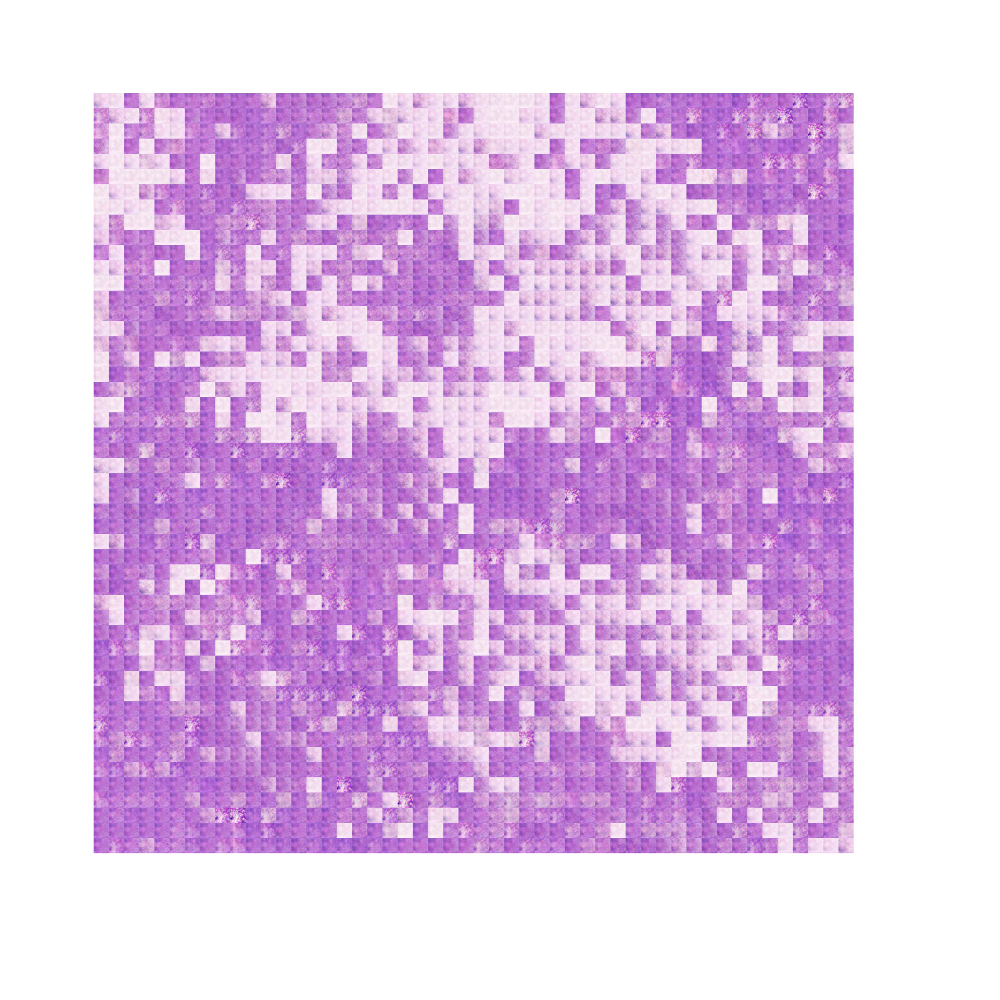

In [38]:
plt.figure(figsize=(5,5),dpi=500)
plt.imshow(recon)
plt.axis('off')

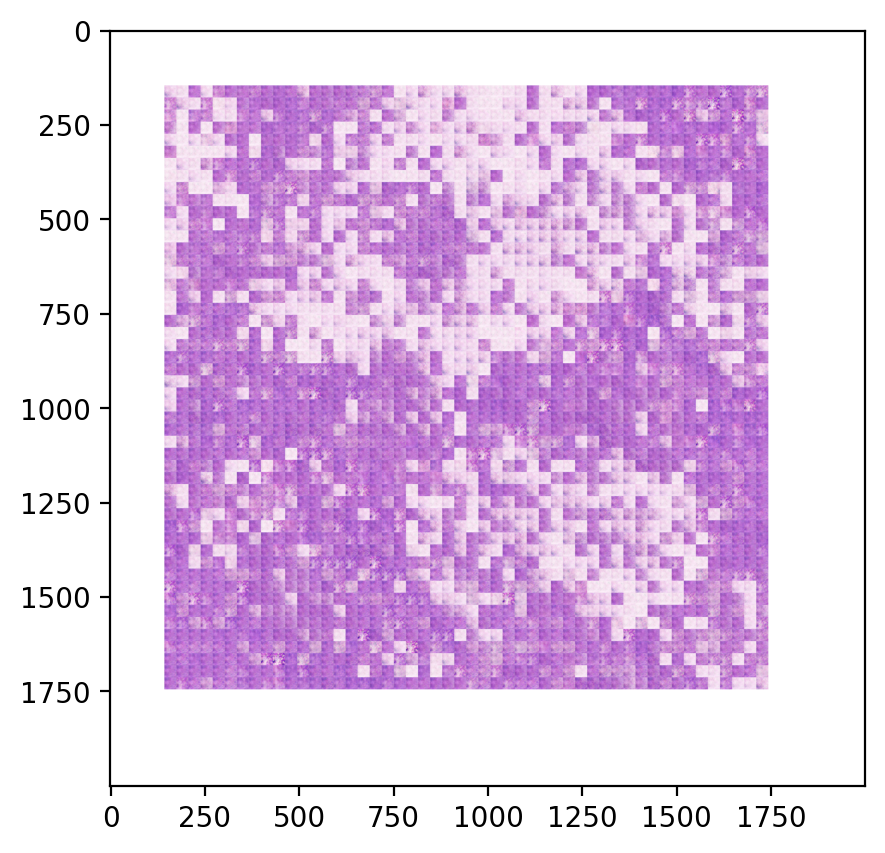

In [36]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

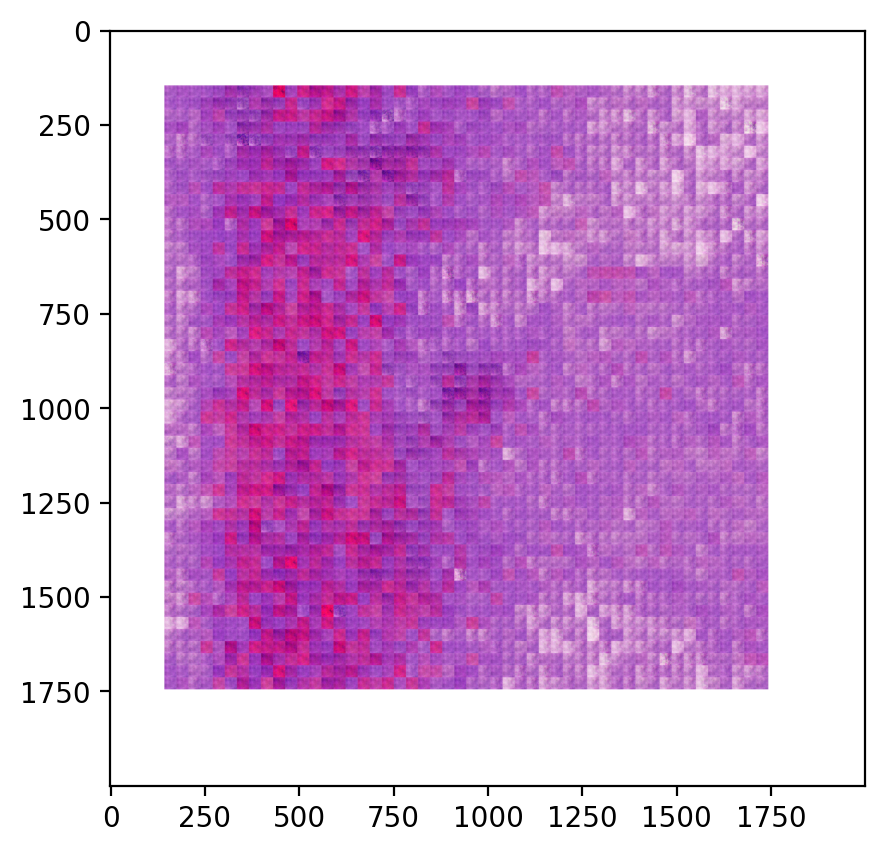

In [154]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

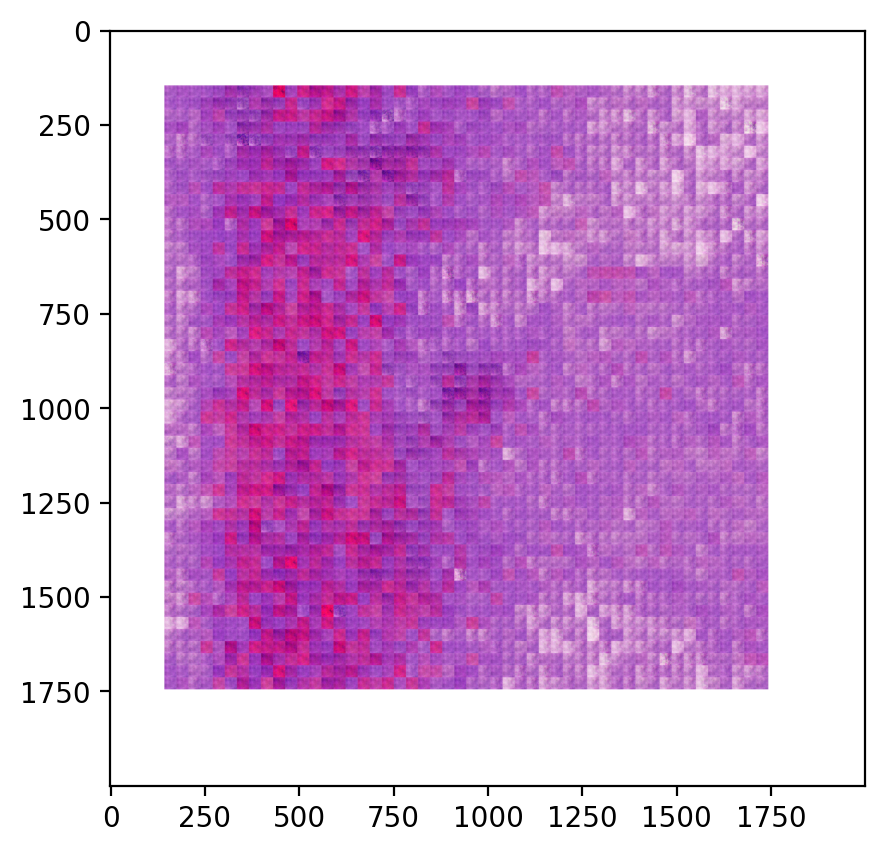

In [80]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

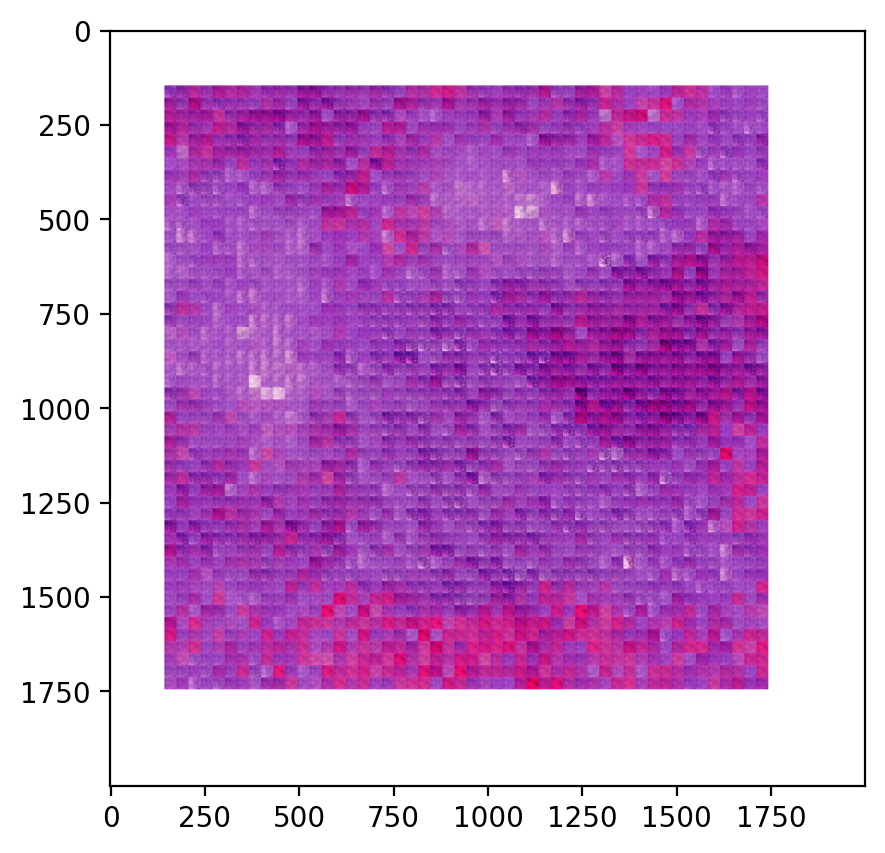

In [43]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

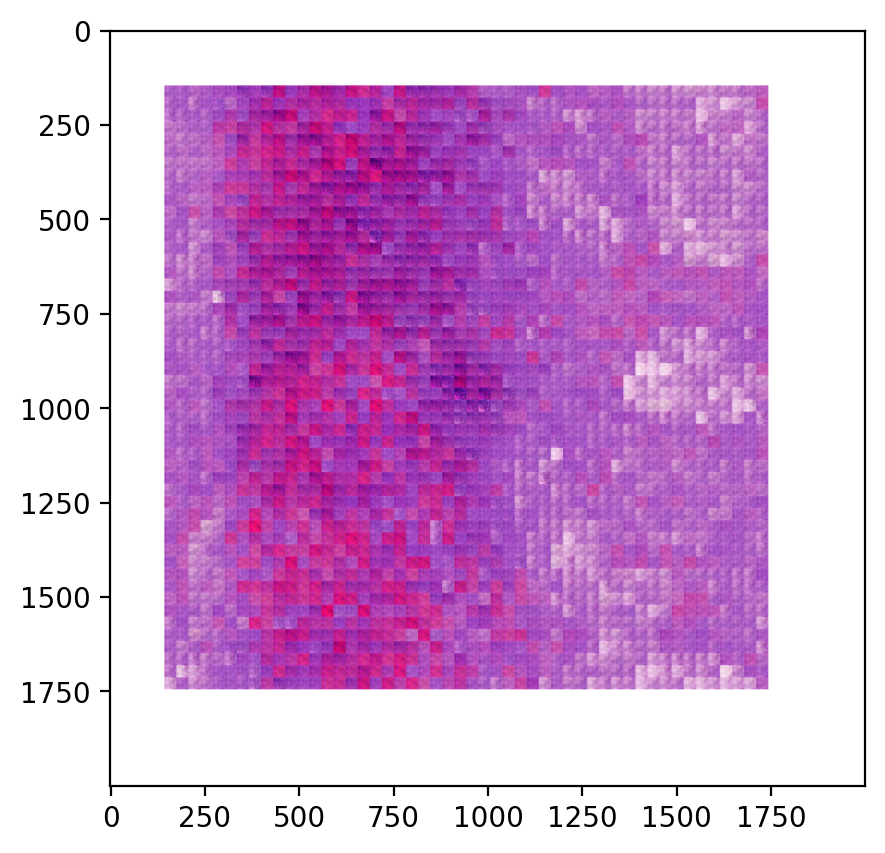

In [52]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

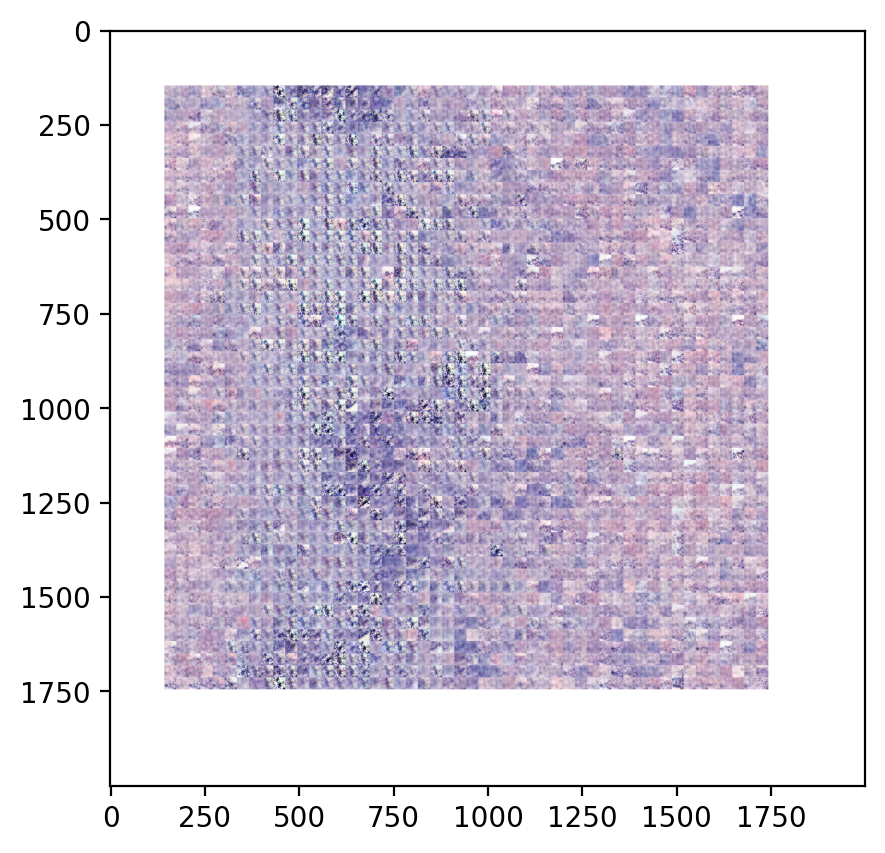

In [440]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

In [56]:
io.imsave('simu_data/simu_10/spatial/tissue_hires_image.png',(recon*255).astype('uint8'))

In [46]:
io.imsave('data/simu_debug/spatial/tissue_hires_image.png',(recon*255).astype('uint8'))

In [47]:
map_info[['img_col','img_row']]=adata5_new_anndata.obsm['spatial']

In [52]:
adata5_new_anndata.obsm['spatial']

array([[ 160,  160],
       [ 160,  192],
       [ 160,  224],
       ...,
       [1728, 1664],
       [1728, 1696],
       [1728, 1728]])

In [48]:
map_info

,array_row,array_col,img_col,img_row
exper0_location_0,5,5,160,160
exper0_location_1,5,6,160,192
exper0_location_2,5,7,160,224
exper0_location_3,5,8,160,256
exper0_location_4,5,9,160,288
...,...,...,...,...
exper0_location_2495,54,50,1728,1600
exper0_location_2496,54,51,1728,1632
exper0_location_2497,54,52,1728,1664
exper0_location_2498,54,53,1728,1696


In [49]:
#tissu_pos = pd.read_csv('data/MBC_1B/spatial/tissue_positions_list.csv',header=None)
#tissu_pos.index = np.array(tissu_pos[0])
#tissu_pos = tissu_pos.loc[adata4.obs.index,:]
#tissu_pos.index = adata5.obs.index
#tissu_pos[0] = adata5.obs.index
map_info.to_csv('data/simu_debug/spatial/tissue_positions_list.csv',index=True)

In [50]:
adata5_new_anndata

AnnData object with n_obs × n_vars = 2500 × 6000
    obsm: 'spatial'

In [51]:
adata5_new_anndata.write('data/simu_debug/simu_debug.h5ad')

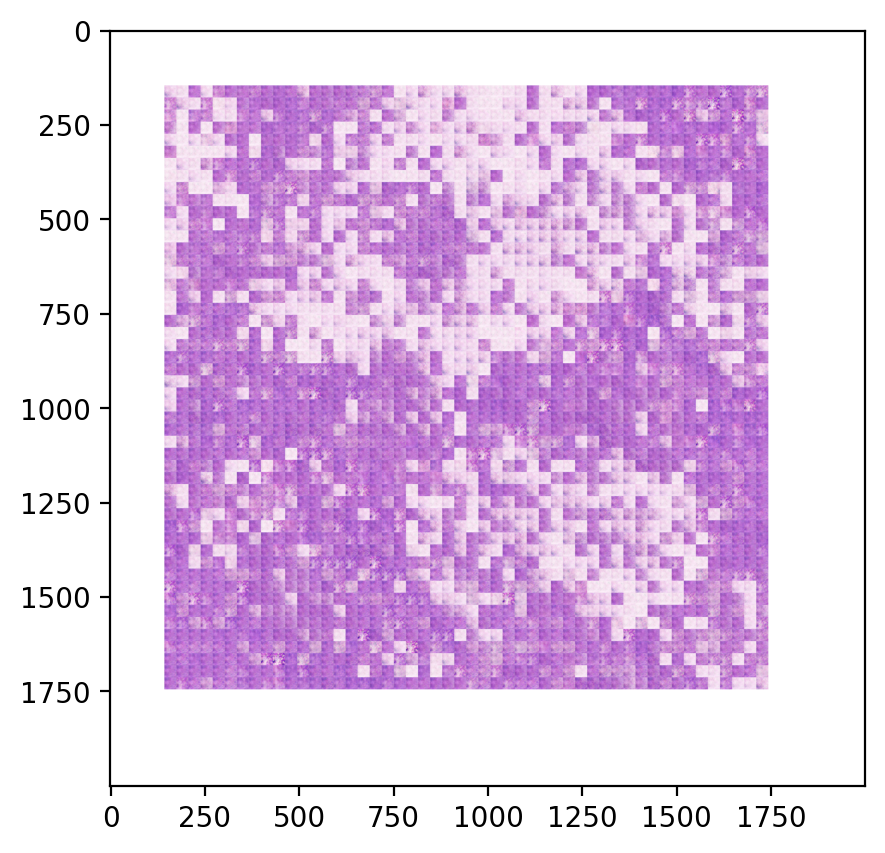

In [45]:
plt.figure(figsize=(5,5),dpi=200)
plt.imshow(recon)

# Main: integration